# 04 - SnakeCLEF - Cleaning the Dataset

The notebook contains procedure for removing noisy samples from the training and validation datasets.

In [1]:
import os

os.chdir('..')

In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

import torch

from src.core import models, data, training
from src.utils import nb_setup, io, visualization as viz


DATA_DIR = 'data/snake_clef2021_dataset/'
TRAIN_SET_DIR = 'train'

SEED = 42

nb_setup.init()
nb_setup.set_random_seed(SEED)

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f'Device: {device}')

Device: cpu


## Load the Data and Pre-trained ResNet-101

In [3]:
# load metadata
train_df = pd.read_csv(DATA_DIR + 'SnakeCLEF2021_train_metadata_PROD.csv')

classes = np.unique(train_df['binomial'])
no_classes = len(classes)
print(f'No classes: {no_classes}')
print(f'Train set length: {len(train_df):,d}')

No classes: 772
Train set length: 386,006


In [4]:
# load pre-trained resnet for ImageNet classification
model = models.resnet101(pretrained=True)
model_config = model.pretrained_config
batch_size = 512

In [5]:
# create transforms
train_tfms, valid_tfms = data.get_transforms(
    size=model_config['input_size'], mean=model_config['image_mean'],
    std=model_config['image_std'])

# create data loaders
flickr_df = train_df[train_df['source'] == 'flickr']
trainloader = data.get_dataloader(
    flickr_df, img_path_col='image_path', label_col='binomial',
    path=DATA_DIR + TRAIN_SET_DIR, transforms=train_tfms, labels=classes,
    batch_size=batch_size, shuffle=False, num_workers=4)

## Classify ImageNet-1k Labels

In [6]:
import os

pred_file = '01_data_preparation/snake_flickr_imagenet_pred.npy'
if not os.path.isfile(pred_file):
    pred, _, _ = training.predict(model, trainloader)
    np.save(pred_file, pred)
else:
    pred = np.load(pred_file)

## Filter Out Noisy Samples

In [7]:
# load imagenet classes
imagenet_classes = io.read_json('data/imagenet_classes.json')


# create prediction dataframe
pred_df = pd.DataFrame(index=flickr_df.index)
pred_df['pred_id'] = pred.argmax(1)
pred_df['pred_conf'] = pred.max(1)
pred_df['img_id'] = np.arange(len(pred))
pred_df['pred'] = pred_df['pred_id'].replace({int(k): v for k, v in imagenet_classes.items()})
pred_df['keep'] = False
pred_df['binomial'] = flickr_df['binomial']

pred_df

,pred_id,pred_conf,img_id,pred,keep,binomial
9,854,0.257704,0,"theater curtain, theatre curtain",False,Boa constrictor
13,58,0.810377,1,water snake,False,Naja sumatrana
18,60,0.506232,2,"night snake, Hypsiglena torquata",False,Epicrates cenchria
40,49,0.467431,3,"African crocodile, Nile crocodile, Crocodylus ...",False,Vipera seoanei
43,64,0.518335,4,green mamba,False,Trimeresurus albolabris
...,...,...,...,...,...,...
385969,65,0.276188,50625,sea snake,False,Lampropeltis californiae
385989,52,0.308235,50626,"thunder snake, worm snake, Carphophis amoenus",False,Drymarchon couperi
385992,58,0.265819,50627,water snake,False,Natrix tessellata
385997,61,0.915229,50628,"boa constrictor, Constrictor constrictor",False,Lampropeltis triangulum


In [8]:
def str_contains(s, arr):
    return any([x.lower() in s for x in arr])


# create list of snake classes
snake_class_patterns = [
    'snake', 'cobra', 'viper', 'mamba', 'boa ', 'lizard',
    'alligator',
    # 'banded gecko', 'centipede', 'crocodile',  # contain some false positives
    # 'newt', 'slug', 'bullfrog'  # contain some false positives
]
snake_classes = [x for x in imagenet_classes.values()
                 if str_contains(x, snake_class_patterns)]
len(snake_classes), snake_classes

(25,
 ['whiptail, whiptail lizard',
  'frilled lizard, Chlamydosaurus kingi',
  'alligator lizard',
  'green lizard, Lacerta viridis',
  'Komodo dragon, Komodo lizard, dragon lizard, giant lizard, Varanus komodoensis',
  'American alligator, Alligator mississipiensis',
  'thunder snake, worm snake, Carphophis amoenus',
  'ringneck snake, ring-necked snake, ring snake',
  'hognose snake, puff adder, sand viper',
  'green snake, grass snake',
  'king snake, kingsnake',
  'garter snake, grass snake',
  'water snake',
  'vine snake',
  'night snake, Hypsiglena torquata',
  'boa constrictor, Constrictor constrictor',
  'rock python, rock snake, Python sebae',
  'Indian cobra, Naja naja',
  'green mamba',
  'sea snake',
  'horned viper, cerastes, sand viper, horned asp, Cerastes cornutus',
  'diamondback, diamondback rattlesnake, Crotalus adamanteus',
  'sidewinder, horned rattlesnake, Crotalus cerastes',
  "dragonfly, darning needle, devil's darning needle, sewing needle, snake feeder, snak

In [9]:
# select images to keep
cond = (pred_df['pred'].isin(snake_classes))  # (pred_df['pred_conf'] < 1.0) &
pred_df.loc[cond, 'keep'] = True
pred_df.loc[~cond, 'keep'] = False
pred_df[pred_df['keep']].sort_values('pred_conf')

,pred_id,pred_conf,img_id,pred,keep,binomial
28159,59,0.022593,3735,vine snake,True,Agkistrodon contortrix
181319,52,0.023245,23734,"thunder snake, worm snake, Carphophis amoenus",True,Coluber constrictor
319082,41,0.031115,41976,"whiptail, whiptail lizard",True,Leptodeira septentrionalis
276693,56,0.043344,36469,"king snake, kingsnake",True,Lampropeltis californiae
22656,52,0.052302,2994,"thunder snake, worm snake, Carphophis amoenus",True,Pantherophis alleghaniensis
...,...,...,...,...,...,...
288765,63,0.999997,38084,"Indian cobra, Naja naja",True,Naja naja
318686,63,0.999999,41926,"Indian cobra, Naja naja",True,Naja nigricollis
144250,53,0.999999,18979,"ringneck snake, ring-necked snake, ring snake",True,Diadophis punctatus
8816,63,1.000000,1166,"Indian cobra, Naja naja",True,Naja naja


## Examples of Images to Keep

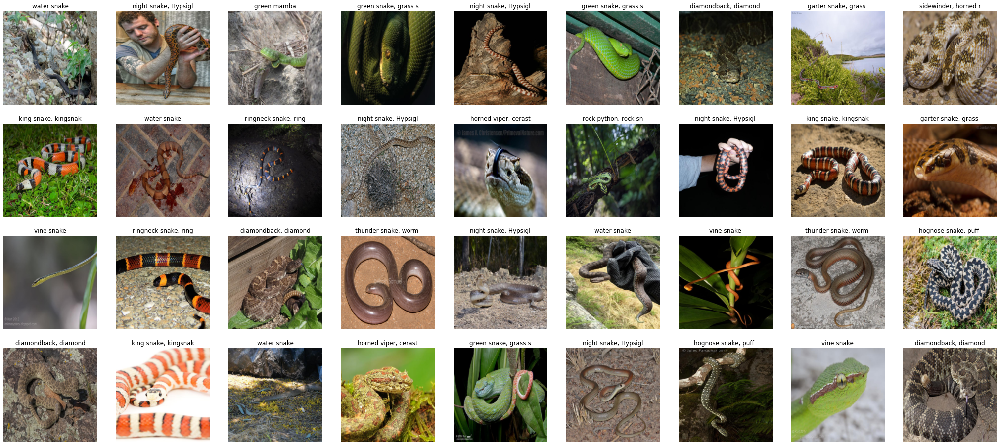

In [10]:
fig, axs = viz.create_fig(nrows=4, ncols=9, colsize=4, rowsize=4)
cond = pred_df['keep']
for i, ax in enumerate(axs):
    img_id = pred_df.loc[cond, 'img_id'].iloc[i]
    pred_label = pred_df.loc[cond, 'pred'].iloc[i]
    trainloader.dataset.show_item(img_id, ax=ax)
    ax.set(title=pred_label[:20])

## Examples of Filtered Out Images

In [11]:
cond = ~pred_df['pred'].isin(snake_classes)
pred_df.loc[cond, 'pred'].value_counts().head(15)

puck, hockey puck                                                            433
stage                                                                        167
walking stick, walkingstick, stick insect                                    146
web site, website, internet site, site                                       125
horizontal bar, high bar                                                     113
centipede                                                                    113
cliff, drop, drop-off                                                        107
banded gecko                                                                 107
tailed frog, bell toad, ribbed toad, tailed toad, Ascaphus trui               88
comic book                                                                    75
hen-of-the-woods, hen of the woods, Polyporus frondosus, Grifola frondosa     71
valley, vale                                                                  70
African crocodile, Nile croc

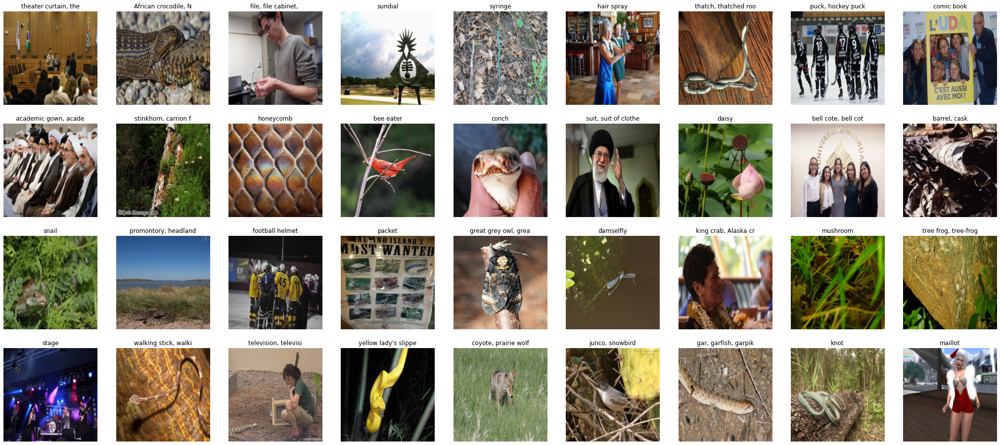

In [12]:
fig, axs = viz.create_fig(nrows=4, ncols=9, colsize=4, rowsize=4)
cond = ~pred_df['keep']
for i, ax in enumerate(axs):
    img_id = pred_df.loc[cond, 'img_id'].iloc[i]
    pred_label = pred_df.loc[cond, 'pred'].iloc[i]
    trainloader.dataset.show_item(img_id, ax=ax)
    ax.set(title=pred_label[:20])

## Review Missing Class

Exclude classes **Echinanthera melanostigma** and **Bolyeria multocarinata** as the dataset doesn't contain relevant images

In [13]:
# store keep values to train_df
train_df.loc[train_df['source'] != 'flickr', 'keep'] = True
train_df.loc[train_df['source'] == 'flickr', 'keep'] = False
train_df.loc[pred_df.index, 'keep'] = pred_df['keep']

# manually exclude two classes that don't have relevant images
cond = train_df['binomial'].isin(['Echinanthera melanostigma', 'Bolyeria multocarinata'])
train_df.loc[cond, 'keep'] = False

In [14]:
new_no_classes = len(train_df.loc[train_df['keep'], 'binomial'].drop_duplicates())
print('No classes:', new_no_classes)

No classes: 770


In [15]:
# list of missing classes
new_classes = train_df.loc[train_df['keep'], 'binomial'].drop_duplicates()
all_classes = train_df['binomial'].drop_duplicates()
all_classes[~all_classes.isin(new_classes)]

7323        Bolyeria multocarinata
19344    Echinanthera melanostigma
Name: binomial, dtype: object

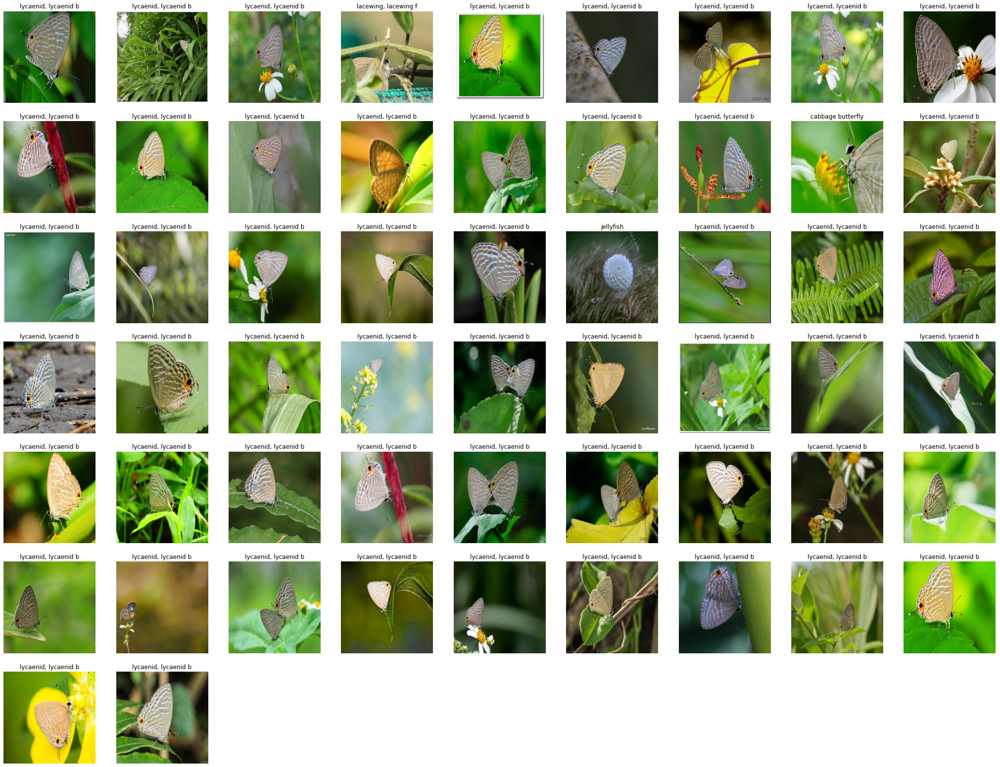

In [16]:
cond = pred_df['binomial'] == 'Echinanthera melanostigma'
fig, axs = viz.create_fig(ntotal=cond.sum(), ncols=9, colsize=4, rowsize=4)
for i, ax in enumerate(axs):
    if i >= cond.sum():
        break
    img_id = pred_df.loc[cond, 'img_id'].iloc[i]
    pred_label = pred_df.loc[cond, 'pred'].iloc[i]
    trainloader.dataset.show_item(img_id, ax=ax)
    ax.set(title=pred_label[:20])

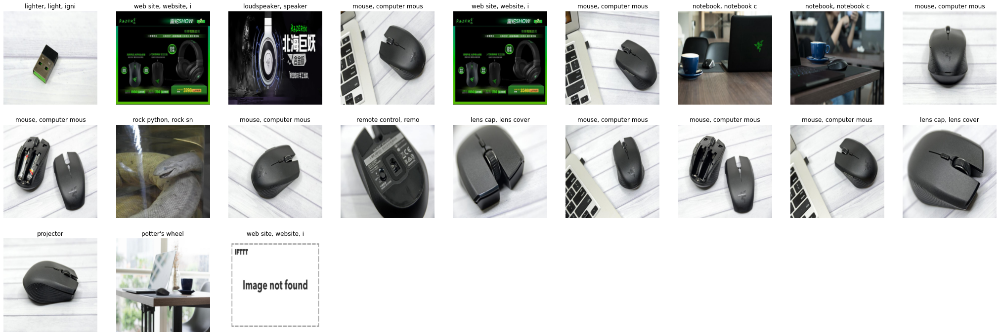

In [17]:
cond = pred_df['binomial'] == 'Bolyeria multocarinata'
fig, axs = viz.create_fig(ntotal=cond.sum(), ncols=9, colsize=4, rowsize=4)
for i, ax in enumerate(axs):
    if i >= cond.sum():
        break
    img_id = pred_df.loc[cond, 'img_id'].iloc[i]
    pred_label = pred_df.loc[cond, 'pred'].iloc[i]
    trainloader.dataset.show_item(img_id, ax=ax)
    ax.set(title=pred_label[:20])

## Create New Metadata CSV File

In [18]:
train_df.fillna('N/A').groupby(['source', 'keep']).size()

source       keep 
flickr       False      8778
             True      41852
herpmapper   True      58351
inaturalist  True     277025
dtype: int64

In [19]:
flickr_df = train_df[train_df['source'] == 'flickr']
flickr_df['keep'].value_counts() / len(flickr_df)

True     0.826625
False    0.173375
Name: keep, dtype: float64

In [20]:
new_df = train_df[train_df['keep']].drop(columns=['keep'])
new_df

,binomial,country,continent,genus,family,UUID,source,subset,class_id,image_path
0,Pantherophis spiloides,United States of America,North America,Pantherophis,Colubridae,fbc816e9552643a2bce4f655b2f3c4e1,inaturalist,train,523,inaturalist/fbc816e9552643a2bce4f655b2f3c4e1.jpg
1,Masticophis taeniatus,United States of America,North America,Masticophis,Colubridae,cbc7ad7141a642f2b92ef7fe05c9d608,inaturalist,train,430,inaturalist/cbc7ad7141a642f2b92ef7fe05c9d608.jpg
2,Crotalus pyrrhus,United States of America,North America,Crotalus,Viperidae,fc4db72953ae4c978ac50acb33adce0c,inaturalist,train,183,inaturalist/fc4db72953ae4c978ac50acb33adce0c.jpg
3,Haldea striatula,United States of America,North America,Haldea,Colubridae,2068c79c956d43dc8a45106e0c808aed,inaturalist,train,305,inaturalist/2068c79c956d43dc8a45106e0c808aed.jpg
4,Natrix natrix,Russia,Europe,Natrix,Colubridae,3e376aaf4f8d42e991c0c8ddc5972f95,inaturalist,train,471,inaturalist/3e376aaf4f8d42e991c0c8ddc5972f95.jpg
...,...,...,...,...,...,...,...,...,...,...
386001,Storeria dekayi,United States of America,North America,Storeria,Colubridae,f0a50a4676a34a2f99c3cb2451c6acd5,inaturalist,val,661,inaturalist/f0a50a4676a34a2f99c3cb2451c6acd5.jpg
386002,Thamnophis sirtalis,United States of America,North America,Thamnophis,Colubridae,4513bbe7752d49dabdff2dd6484c82fc,inaturalist,val,706,inaturalist/4513bbe7752d49dabdff2dd6484c82fc.jpg
386003,Thamnophis sirtalis,Canada,North America,Thamnophis,Colubridae,fca4ce9644b84454bf2d2967bbfd6597,inaturalist,val,706,inaturalist/fca4ce9644b84454bf2d2967bbfd6597.jpg
386004,Pantherophis obsoletus,United States of America,North America,Pantherophis,Colubridae,4650fd94cdc14861a7e12014fcd47520,herpmapper,val,520,herpmapper/4650fd94cdc14861a7e12014fcd47520.jpg


In [21]:
new_df['source'].value_counts()

inaturalist    277025
herpmapper      58351
flickr          41852
Name: source, dtype: int64

In [22]:
new_df.to_csv(DATA_DIR + 'SnakeCLEF2021_train_metadata_cleaned_all.csv', sep=',', index=False)